# Practice: First, Hydro-dynamical PDE models

As modelers of stellar atmospheres, we are primarily interested in solving the equations of mass, momentum, and energy balance, along with the equations governing the evolution of the magnetic field, the transport equations for the radiation field, heat flux equations, etc. For this project, we will start with the hydrodynamic equations in 1 dimension as follows: 

$$ \frac{\partial \rho}{\partial t} + \nabla \cdot (\rho \bf u) = 0 $$

$$ \frac{\partial \rho {\bf u}}{\partial t} + \nabla \cdot (\rho {\bf u} \otimes {\bf u}) = - \nabla (P_g)$$

$$ \frac{\partial e}{\partial t } = -\nabla\cdot e {\bf u} -P_g \nabla \cdot {\bf u}$$

where $\rho$, $\bf u$, $P_g$, and $e$ are the density, velocity vector, gas pressure, and internal energy. $\cdot$ and $\otimes$ are the dyadic and tensorial product, respectively. One extra equation needs to connect the pressure with the energy. For this you can use $P_g  = (\gamma-1)e/\rho$ where $\gamma=5/3$. Note that, in 1 dimension the operation  $\nabla \cdot (\rho {\bf u} \otimes {\bf u})$ becomes as follows: 

$$ \nabla \cdot (\rho {\bf u} \otimes {\bf u}) = \frac{\partial (\rho u^2)}{\partial x} $$

## 1- Build or select your code 

In this exercise, you can select one of the following options: 

1. Build your hydro-dynamical (HD) numerical code applying the tools/functions learned during the 6th different assessment. Solve the above set of equations in one dimension. 

    __A plus__ implement the [Bifrost 6th order spatial derivative, 5th order spatial interpolation](https://github.com/AST-Course/AST5110/wiki/Discretization) with the hyper-diffusion scheme (see [wiki](https://github.com/AST-Course/AST5110/wiki/Hyper-diffusive)). Note that Bifrost is using a [staggered mesh](https://github.com/AST-Course/AST5110/wiki/Staggered-mesh) where the density, pressure, energy, and temperature are cell-centered, and velocity and momentum are at the edges (in 1 dimension). 

    __A plus__ implement the [Flux limiter method](https://github.com/AST-Course/AST5110/wiki/Flux-limiter-method).

    __A plus__ implement the [Rieman Solver method](https://github.com/AST-Course/AST5110/wiki/Rieman-Solver-method).

    What would you choose for the CFL condition? 

2. Use the Bifrost, Ebysus, or other numerical codes you are interested in learning. 

    Note that I can help only with the numerical codes that I'm familiar with, but you should still select the ones you are interested in as long as you have access to them. 

    Johannes: Since you do this excersize with an existing code. You will need to investigate, spatial derivative order and temporal orders. Fully test with Riemann solvers. As well as investigate the k-diagrams for a test that has initial random perturbations in density/velocity. 

## 2- Test the code

Set your code to run a 1D problem using the following initial conditions. The fluid is initially at rest on either side of a density and pressure jump. To the left, respectively right side of the interface, we have: 

$\rho_L = 0.125$

$\rho_R = 1.0$

$Pg_L = 0.125/\gamma$

$Pg_R = 1.0/\gamma$

The ratio of specific heats is chosen to be $\gamma = 5/3$ on both sides of the interface. The units are normalized, with the density and pressure in units of the density and pressure on the left-hand side of the jump and the velocity in units of the sound speed. The length unit is the size of the domain and the time in units of the time required to cross the domain at the speed of sound.

What boundary conditions would you choose?
What do you see? 

This is known as the Sod-shock tube test [Sod et al. 1978](https://ui.adsabs.harvard.edu/abs/1978JCoPh..27....1S/abstract), a standard test in computational HD codes. It consists of a one-dimensional flow discontinuity problem that provides a good test of a compressible code’s ability to capture shocks and contact discontinuities within a few grid zones and produce the correct density profile in a rarefaction or expansion wave. The test can also be used to check if the code can satisfy the Rankine-Hugoniot shock jump conditions since this test has an analytical solution. If you have access, you can also look at _Computational Gasdynamics book from Culbert B. Laney_ Section 5. However, many other books will describe this problem in detail. 
 
Compare the simulation with the analytical solution. This could be used for a sanity test after new additions to the code. 

__Suggestion__ This test might be too complex to debug the code. However, as a starting debugging test, you can consider an advection test (constant initial velocity) of a gaussian density perturbation in pressure balance. 

 Johannes: In addition, add and 1D MHD Roe tests. 

## 3-  Two system of equations: two fluids (Gaute Amesson Holen). 

The chromosphere, transition region and corona are weakly collisional. Therefore, different fluids or species can experience different forces and consequently drift with other fluids. As a result, under these conditions, single fluid equations are not accurate enough. The presence of velocity drift between fluids could be eventually dissipate and heat the plasma. 

Duplicate the HD equations and couple them with the momentum and energy exchange as follows: 

$ \frac{\partial \rho_\alpha}{\partial t} + \nabla \cdot (\rho_\alpha \bf u_\alpha) = 0 $

$ \frac{\partial \rho_\alpha {\bf u_\alpha}}{\partial t} + \nabla \cdot (\rho_\alpha {\bf u_\alpha} \otimes {\bf u_\alpha}) = - \nabla (P_{g\alpha}) + \rho_\alpha \nu_{\alpha\beta}(u_\alpha-u_\beta)$

$ \frac{\partial e_\alpha}{\partial t } = -\nabla\cdot e_\alpha {\bf u_\alpha} -P_{g\alpha} \nabla \cdot {\bf u_\alpha} + Q_{\alpha}^{\alpha\beta}$

where $\alpha= [i,n]$ and $\beta$ refer either to ions $i$ or neutrals $n$. For simplicity, lets assume hydrogen and protons and consider to impose a fix collision frequency. Due to conservation $\rho_\alpha \nu_{\alpha\beta}=\rho_\beta \nu_{\beta\alpha}$. 


$Q_{\alpha}^{\alpha\beta} = \frac{n_{\alpha} m_{\alpha} \nu_{\alpha \beta}}{m_{\alpha}+m_{\beta}} \left[m_{\beta}(\vec{u}_\beta - \vec{u}_\alpha)^2+\frac{2 k_B}{\gamma-1} \left(T_{\beta}-T_{\alpha}\right)\right]$

where $m_{\alpha\beta} = \frac{m_{\alpha}m_{\beta}}{m_{\alpha}+m_{\beta}}$, and for this exercise, since we assume only hydrogen, $m_\alpha \approx m_\beta$ is a good proxy. 

For further description of multicomponent fluids see e.g. the book by [Zhdanov 2002](https://ui.adsabs.harvard.edu/abs/2002PPCF...44.2283Z/abstract), [Khomenko et al 2014](https://ui.adsabs.harvard.edu/abs/2014PhPl...21i2901K/abstract). 


#### 3a- Test the code: 

Consider the following tests to validate the implementation: 

    1) Consider an scenario with no heating sources and constant collision frequency. In that case, it is simple to compute the slope in loglog scale of the velocity drift. 
        1a) What would happen in you turn $Q^{\alpha\beta}_\alpha$ on? 
    2) Assuming zero velocity drift, what would be the temperature evolution when the two fluids are different?     

### 4- Energy dissipated in the chromosphere. 

Ion-neutral interaction cans play a big role on dissipating the magnetic energy. The figure below reveals the collision frequency parameter range within the chromosphere. A zero order of the velocity drift can be found in [Martinez-Sykora et al 2016](https://iopscience.iop.org/article/10.3847/2041-8205/831/1/L1/pdf) Fig. 4b. Use the numerical code to provide a better understanding on the time-scale of the heating and damping mechanism within the chromosphere. 

<img src="./figure_log.png" />

__bonus__ One can compute the collision frequency as follows: 

$\nu^{\text{col,L}}_{\alpha, \beta}=\frac{m_{\alpha,\beta}}{m_{\beta}} n_{\beta} u^{th}_{\alpha,\beta}\, \sigma_{\alpha,\beta}\left(T_{\alpha,\beta}\right)$

where $T_{\alpha,\beta} =(m_{\alpha} T_{\alpha}+m_{\beta} T_{\beta} )/(m_{\alpha}+m_{\beta})$ is the weigthed temperature, $u^{th}_{\alpha,\beta} = |\sqrt{\frac{8}{\pi\mu_{\alpha,\beta}}}|$ is the thermal velocity with $\mu_{\alpha,\beta} = \frac{\mu_{\alpha}\,\mu_{\beta}}{\mu_{\alpha}+\mu_{\beta}}$ and $\mu_{\alpha} = \frac{m_\alpha}{K_B T_\alpha}$. $K_B$ is the Boltzmann constant. The cross-section ($\sigma_{\alpha,\beta}(\left(T_{\alpha,\beta}\right)$) are tabulated as a function of temperature and for this exersize you can use the one from [Bruno et al. 2010](https://aip.scitation.org/doi/10.1063/1.3495980). Ask me for the table. 
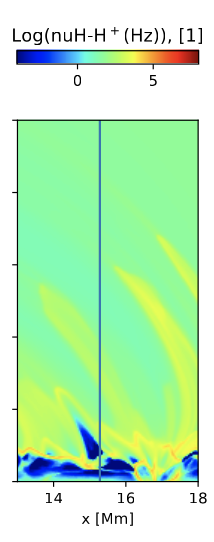

First, we build the numerical object oriented codes for multiple species first uncoupled i.e no $\rho_\alpha \nu_{\alpha\beta}(u_\alpha-u_\beta)$ and $Q_{\alpha}^{\alpha\beta}$ terms. We set up the two species with the same sod test tube setup, but flip the pressure and and density profiles for the second species. 

# Implementing the CFD equations and sod test tube

The first step is to implement the momentum, density and energy equations listed above.

The first issue we encounter is speeds far exceeding the speed of sound, quickly breaking the simulation. A flux limiter is a good way to deal with this, but for now we simply set a speed limit after the update such that:

$$
u_j^{n+1} = min(c_j^{n},u_j^{n+1})
$$

Where $c_j$ is the speed of sound given by:
$$
c = \sqrt{\frac{\gamma P_g}{\rho}}
$$
 This leads to a noisy but mostly stable test tube simulation seen below

In [1]:
import numpy as np
import nm_lib as nm
from matplotlib import style
style.use('dark_background')

In [1]:
nump = 256
cfl_cut = 0.1
Nt = 1000
gamma = 5/3

xx,u,rho,Pg = nm.init_sod_test(nump,1.0,0.125,1.0/gamma,0.125/gamma)

solver = nm.Multispecies(xx,nm.deriv_cent,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("LR",u,rho,Pg,gamma)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut)

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t,xx,n_frames=30)


# Adding diffusion

The first problem we tackle is the noise. Oscillations in Computational Fluid Dynamics (CFD) is a very common problem, especially when dealing with shocks such as the sod tube test. Here, we will deal with the oscillations by implementing diffusion to our equations.

### Artificial viscocity added to the pressure term

We add the diffusive term $q$ to the pressure term in the momentum and energy equation. This is known as adding artificial viscocity, and was first done by Richtmayer and Von Neumann in the 1950s:

$$
q_{RvN} = - \rho c_q \Delta x^2 \frac{\partial ^2 x}{\partial x^2}
$$

Since then, there has been improvements, briefly outlined by L. G. Margolin · N. M. Lloyd–Ronning https://arxiv.org/pdf/2202.11084.pdf where a first order term is added. Here, we have decided to use a slightly modified version of it such that:

$$
q = - \rho \left( c_q \Delta x^2 \frac{\partial ^2 u}{\partial x^2} + c_L \Delta x \frac{\partial u}{\partial x} \right)
$$

Where $c_q$ and $c_L$ are unitless values decided by the user determining the shape of the shock. Playing around we found that $c_q = 0.5$ and $c_L = 3$ seem to be good values.

In [2]:
import warnings
warnings.filterwarnings('ignore') #One of the cases blow up so theres so many warnings...

nump = 256
cfl_cut = 0.1
Nt = 2000

gamma = 5/3

xx,u,rho,Pg = nm.init_sod_test(nump,1.0,0.125,1.0/gamma,0.125/gamma)

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("diffusive cq=0.5, cL = 3",u,rho,Pg,gamma, cq = 0.5, cL = 3, cD = 0)
solver.add_species("diffusive cq=1, cL = 1",u,rho,Pg,gamma, cq = 1, cL = 1, cD = 0)
solver.add_species("diffusive cq=2, cL = 2",u,rho,Pg,gamma, cq = 2, cL = 2, cD = 0)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=False, Q_col = False, col = False)

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t,xx,n_frames=35, ylim=[0,1])

Above we see that the shockwave no longer causes the simulation to blow up if we have the right values for $c_q$ and $c_L$. However, there are still some oscillations in the density. This makes sense, as the diffusive terms were only added to the momentum and energy equations, while the density is free to oscillate without diffusion.

### Density diffusive term

Inspired by the R-v-N diffusive terms, a second term is added to the density in the continuity equation:
$$
q_d = D \frac{\partial \rho u}{\partial x}
$$

Where $D = c_D \Delta x \rho$ and $c_D$ is some unitless constant set by the user (1 by default). Our new set of diffusive equations are:


$$ \frac{\partial \rho}{\partial t} + \nabla \cdot ((\rho + q_d) \bf u )= 0 $$

$$ \frac{\partial \rho {\bf u}}{\partial t} + \nabla \cdot (\rho {\bf u} \otimes {\bf u}) = - \nabla (P_g + q)$$

$$ \frac{\partial e}{\partial t } = -\nabla\cdot e {\bf u} -(P_g + q) \nabla \cdot {\bf u}$$

Now, the CFD noise is redused to a point where our simulation can handle shocks very well as we can see in the plot below:

In [1]:
import numpy as np
import nm_lib as nm
from matplotlib import style
style.use('dark_background')

In [3]:
nump = 256
cfl_cut = 0.1
Nt = 1000
gamma = 5/3

xx,u,rho,Pg = nm.init_sod_test(nump,1.0,0.125,1.0/gamma,0.125/gamma)

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="edge")
solver.add_species("diffusive cq=0.5, cL = 3, cD = 1",u,rho,Pg,gamma, cq = 0.5, cL = 3, cD = 1)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=False, Q_col = False, col = False)

names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)
nm.animMultMHDparams(names,ets,uts,rhots,Pts,t,xx,n_frames=35, ylim=[0,1])

# Adding colisions

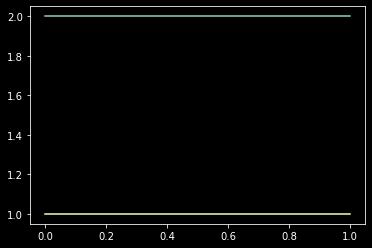

In [1]:
import numpy as np
import nm_lib as nm
import matplotlib.pyplot as plt
from matplotlib import style
style.use('dark_background')



nump = 32
cfl_cut = 0.1
Nt = 2000
gamma = 5/3

xx,rho,Pg,u1,u2 = nm.init_vel_drift(nump,1.0,1.0,2.0,1.0)

m = 1.67262192e-27

plt.plot(xx,u1)
plt.plot(xx,u2)

solver = nm.Multispecies(xx,nm.deriv_4tho,bnd_limits = [8,8],bnd_type="wrap")
solver.add_species("LR",u1,rho,Pg,gamma, m = m, cq = 0.5, cL = 3, cD = 1)
solver.add_species("RL",u2,np.flip(rho),np.flip(Pg),gamma, m = m, cq = 0.5, cL = 3, cD = 1)

t,xx,values = solver.run(Nt,cfl_cut=cfl_cut,coupled=True, Q_col = True)

#et,ut,rhot,Pt,t = nm.evolve_hydro(xx,u,rho,Nt,Pg,gamma,cfl_cut = cfl_cut, ddx = nm.deriv_cent, bnd_limits = [4,4],bnd_type="edge")


In [2]:
names,uts,rhots,Pts,ets = nm.unpack_CFD_values(values)

nm.animMultMHDparams(names,ets,uts,rhots,Pts,t,xx,n_frames=30)
